# Imports

In [1]:
import shutil
import json

from PIL import Image, ImageOps

import numpy as np
import pandas as pd

In [2]:
!pip show openai

Name: openai
Version: 1.1.1
Summary: Client library for the openai API
Home-page: 
Author: 
Author-email: OpenAI <support@openai.com>
License: 
Location: /home/divinekage/miniconda3/envs/RAGcipe_openai111/lib/python3.10/site-packages
Requires: anyio, distro, httpx, pydantic, tqdm, typing-extensions
Required-by: 


In [3]:
import os
import base64
import time
import requests

from dotenv import load_dotenv, find_dotenv
import openai
from openai import OpenAI

In [4]:
# secret keys
load_dotenv(find_dotenv()) # read local .env file

True

In [5]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# Image

In [6]:
# input
img_path = "./images/ocr_images/done/cacio_e_pepe.jpg"

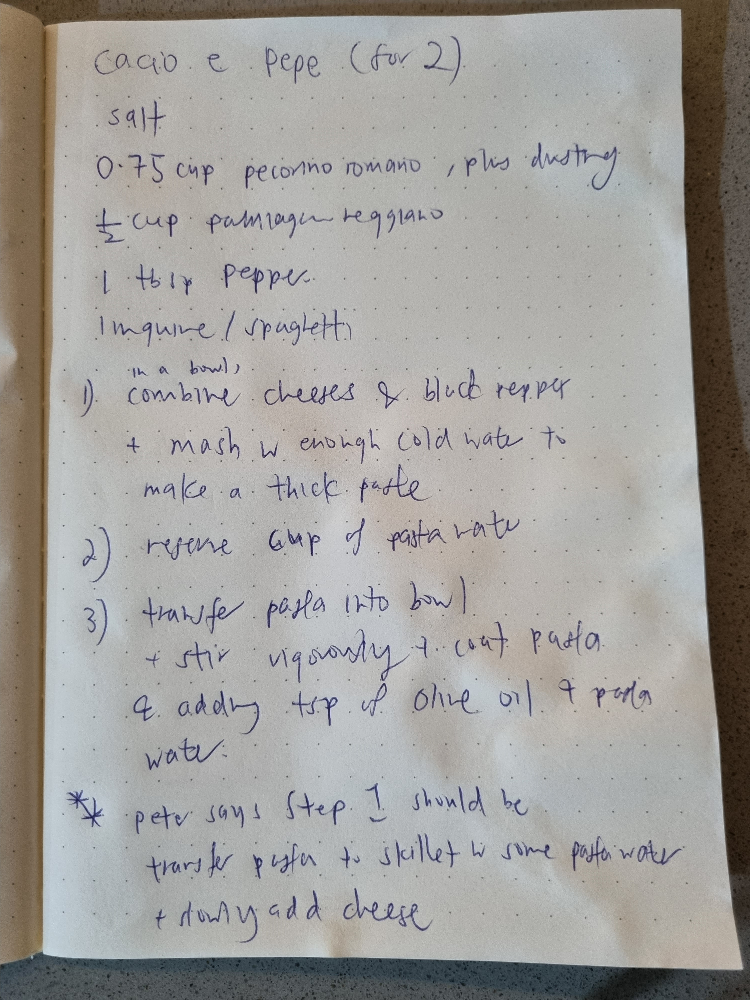

In [7]:
img_read = Image.open(img_path)
img_read = ImageOps.exif_transpose(img_read)
img_read

# Inference (OCR)

In [8]:
# Function to encode the image
def encode_image(image_path):
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode('utf-8')

# Path to your image
image_path = img_path

# Getting the base64 string
base64_image = encode_image(image_path)

headers = {
    "Content-Type": "application/json",
    "Authorization": f"Bearer {os.environ['OPENAI_API_KEY']}"
}

payload = {
    "model": "gpt-4-vision-preview",
    "messages": [
      {
        "role": "user",
        "content": [
          {
            "type": "text",
            "text": "Describe what’s the recipe in this image?"
          },
          {
            "type": "image_url",
            "image_url": {
              "url": f"data:image/jpeg;base64,{base64_image}"
            }
          }
        ]
      }
    ],
    "max_tokens": 300
}

response = requests.post("https://api.openai.com/v1/chat/completions", headers=headers, json=payload)
response

<Response [200]>

In [9]:
response_dict = response.json()
message_dict = response_dict['choices'][0]['message']
print(message_dict['content'])

The image shows a handwritten recipe for Cacio e Pepe, which is a classic Italian pasta dish. Here is the recipe as written:

Ingredients:
- Salt
- 0.75 cup Pecorino Romano cheese, plus dusting
- 1/2 cup Parmigiano Reggiano cheese
- 1 tbsp pepper
- Linguine or spaghetti

Instructions:
1. In a bowl, combine cheeses and black pepper and mash with enough cold water to make a thick paste.
2. Reserve a cup of pasta water.
3. Transfer pasta into the bowl and stir vigorously, coating the pasta, and adding a tsp of olive oil or pasta water.

Additionally, there's a note that suggests an alternative methodology from someone named Peter. The note states:
"* Peter says Step. 1 should be transfer pasta to skillet w/ some pasta water & gradually add cheese."

Based on this, it seems that the recipe calls for cooking the pasta separately, preparing a cheese and pepper mixture with some water to form a paste, and then combining the two, adding reserved pasta water to achieve the desired sauce consist

# Post-process

In [10]:
system_prompt = "You are an expert chef who who always returns your answer in JSON."

user_prompt  = "From the given text, identify the title of the recipe, required ingredients, and the step to make it."
user_prompt += "\nReturn in under 'recipe title' , 'ingredients' and 'recipe steps'."
user_prompt += f"\n```\n{message_dict['content']}\n```"
print(user_prompt)

recipe_breakdown_client = OpenAI()

completion = recipe_breakdown_client.chat.completions.create(
  model="gpt-3.5-turbo-1106",
  response_format={"type": "json_object"},
  messages=[
    {"role": "system", "content": system_prompt},
    {"role": "user", "content": user_prompt }
  ]
)

print(completion.choices[0].message)

groceries_list = json.loads(completion.choices[0].message.content)
print(groceries_list)

recipe_title = groceries_list['recipe title']
recipe_title

ingredients = groceries_list['ingredients']
ingredients

recipe_steps = groceries_list['recipe steps']
recipe_steps

From the given text, identify the title of the recipe, required ingredients, and the step to make it.
Return in under 'recipe title' , 'ingredients' and 'recipe steps'.
```
The image shows a handwritten recipe for Cacio e Pepe, which is a classic Italian pasta dish. Here is the recipe as written:

Ingredients:
- Salt
- 0.75 cup Pecorino Romano cheese, plus dusting
- 1/2 cup Parmigiano Reggiano cheese
- 1 tbsp pepper
- Linguine or spaghetti

Instructions:
1. In a bowl, combine cheeses and black pepper and mash with enough cold water to make a thick paste.
2. Reserve a cup of pasta water.
3. Transfer pasta into the bowl and stir vigorously, coating the pasta, and adding a tsp of olive oil or pasta water.

Additionally, there's a note that suggests an alternative methodology from someone named Peter. The note states:
"* Peter says Step. 1 should be transfer pasta to skillet w/ some pasta water & gradually add cheese."

Based on this, it seems that the recipe calls for cooking the pasta se

'Cacio e Pepe'

['Salt',
 '0.75 cup Pecorino Romano cheese, plus dusting',
 '1/2 cup Parmigiano Reggiano cheese',
 '1 tbsp pepper',
 'Linguine or spaghetti']

['In a bowl, combine cheeses and black pepper and mash with enough cold water to make a thick paste.',
 'Reserve a cup of pasta water.',
 'Transfer pasta into the bowl and stir vigorously, coating the pasta, and adding a tsp of olive oil or pasta water.']

In [11]:

ingredients_str = "\n".join(f'- {ingredient}' for ingredient in ingredients)
recipe_steps_str = "\n".join(f'- {recipe_step}' for recipe_step in recipe_steps)
new_recipe_steps = f"Ingredients:\n{ingredients_str}\n\nInstructions:\n{recipe_steps_str}"
upload_status = "Successfully identified recipe."
print(f"===\nnew_recipe_steps = {new_recipe_steps}\n===")


===
new_recipe_steps = Ingredients:
- Salt
- 0.75 cup Pecorino Romano cheese, plus dusting
- 1/2 cup Parmigiano Reggiano cheese
- 1 tbsp pepper
- Linguine or spaghetti

Instructions:
- In a bowl, combine cheeses and black pepper and mash with enough cold water to make a thick paste.
- Reserve a cup of pasta water.
- Transfer pasta into the bowl and stir vigorously, coating the pasta, and adding a tsp of olive oil or pasta water.
===
